# Semi-Supervised Tree Image Segmentation by UNet

In [1]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 79.0 MB/s eta 0:00:00


In [2]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import torch
import glob
import pandas as pd
import random
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
from torchvision.transforms import functional as F
from torchvision import transforms, datasets
from torchvision.io import read_image
from torch.utils.data import DataLoader, Dataset, random_split
from matplotlib import patches

In [3]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset
Since our dataset has around 700 unlabeled and 200 labeled tree images, we wanted to increase accuracy by incorporating unlabeled data into the  segmentation task. It's a common challenge that training with unlabeled data, so we will address this problem with semi-supervised learning by generating pseudo-labels.

In [4]:

class TreeDataset(Dataset):
    def __init__(self, image_dir, xml_dir, transform=None, mask_transform=None, image_size=(512, 512), image_list = None):
        """
        Args:
            image_dir (str): Directory with all the .tif images.
            xml_dir (str): Directory with all the .xml annotations.
            transform (callable, optional): Optional transform to be applied on a sample.
            image_size (tuple): Size to resize images and masks to.
        """
        self.image_dir = image_dir
        self.xml_dir = xml_dir
        self.transform = transform
        self.image_size = image_size
        self.mask_transform = mask_transform

        if image_list is not None:
            self.images = {os.path.splitext(f)[0]: f for f in image_list if f.endswith('.tif')}
        else:
            self.images = {os.path.splitext(f)[0]: f for f in os.listdir(image_dir) if f.endswith('.tif')}

        if xml_dir is not None:
            self.annotations = {os.path.splitext(f)[0]: f for f in os.listdir(xml_dir) if f.endswith('.xml')}
        else:
            self.annotations = {}

        self.files = list(self.images.keys())

    def get_bounding_boxes(self, xml_file):
        """
        Parse the XML file to extract bounding boxes.
        Args:
            xml_file (str): Path to the XML file.
        Returns:
            List[Tuple[int, int, int, int]]: List of bounding boxes (xmin, ymin, xmax, ymax).
        """
        tree = ET.parse(xml_file)
        root = tree.getroot()

        boxes = []
        for obj in root.findall('object'):
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            boxes.append((xmin, ymin, xmax, ymax))

        return boxes

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_id = self.files[idx]

        # Construct paths for the image and annotation (if available)
        image_path = os.path.join(self.image_dir, self.images[file_id])
        xml_path = os.path.join(self.xml_dir, self.annotations[file_id]) if file_id in self.annotations else None

        # Load the image and apply resizing and transforms
        image = Image.open(image_path).convert("RGB")
        original_size = image.size  # Save the original size (width, height)
        image = image.resize(self.image_size, Image.BILINEAR)
        if self.transform:
            image = self.transform(image)

        # Apply mask transform
        if xml_path is not None:
            boxes = self.get_bounding_boxes(xml_path)

        if self.mask_transform:
            mask = self.mask_transform(boxes, original_size)
        else:
            # Default to an empty mask if no transform is given
            mask = torch.zeros((1, *self.image_size), dtype=torch.float32)

        return image, mask

    def show_with_annotations(self, idx):
        """
        Display the image with bounding box annotations (as a binary mask).
        Args:
            idx (int): Index of the image to display.
        """
        # Load image and mask
        data = self[idx]
        if isinstance(data, tuple):
            image, mask = data  # For labeled data, image and mask are returned
        else:
            image, mask = data, None  # For unlabeled data, only the image is returned

        # Convert image tensor to numpy array for visualization
        to_pil_image = transforms.ToPILImage()
        image = to_pil_image(image)  # Convert to PIL image
        image = np.array(image)  # Convert to numpy array for plotting

        # Set up plot
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))
        ax[0].imshow(image)
        ax[0].set_title("Image")
        ax[0].axis('off')

        if mask is not None:
            # Convert mask tensor to numpy array for visualization
            mask = mask.squeeze(0).numpy()  # Remove the channel dimension and convert to numpy

            # Display the mask overlay on the image
            ax[1].imshow(image, alpha=0.7)
            ax[1].imshow(mask, cmap='gray', alpha=0.3)  # Overlay the mask in gray
            ax[1].set_title("Image with Mask Overlay")
        else:
            ax[1].imshow(image)
            ax[1].set_title("Image (Unlabeled)")

        ax[1].axis('off')
        plt.show()


# Transform mask to tensor
class MaskToTensor:
    def __init__(self, image_size=(512, 512)):
        self.image_size = image_size

    def __call__(self, boxes, original_size):
        # Create an empty mask
        mask = np.zeros(self.image_size, dtype=np.uint8)

        # Calculate scaling factors
        x_scale = self.image_size[0] / original_size[0]
        y_scale = self.image_size[1] / original_size[1]

        # Draw bounding boxes on the mask
        for (xmin, ymin, xmax, ymax) in boxes:
            cv2.rectangle(mask,
                          (int(xmin * x_scale), int(ymin * y_scale)),
                          (int(xmax * x_scale), int(ymax * y_scale)),
                          color=1, thickness=-1)

        # Convert mask to tensor
        return torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Shape (1, H, W)

# Experiment Design: Split into labeled and unlabeled dataset
def is_labeled(image_name, xml_dir):
    label_name = os.path.splitext(image_name)[0] + '.xml'
    return os.path.exists(os.path.join(xml_dir, label_name))

def create_datasets(image_dir, xml_dir, transform=None, mask_transform=None, image_size=(512, 512), seed=42):
    # List all images in the directory
    all_images = [img for img in os.listdir(image_dir) if img.endswith(('.tif'))]

    # Separate labeled and unlabeled images
    labeled_images = [img for img in all_images if is_labeled(img, xml_dir)]
    unlabeled_images = [img for img in all_images if not is_labeled(img, xml_dir)]

    # Create datasets for labeled and unlabeled images
    labeled_dataset = TreeDataset(
        image_dir=image_dir,
        xml_dir=xml_dir,
        transform=transform,
        mask_transform=mask_transform,
        image_list=labeled_images
    )

    unlabeled_dataset = TreeDataset(
        image_dir=image_dir,
        xml_dir=None,  # No XML directory for unlabeled images
        transform=transform,
        mask_transform=None,  # No mask transform for unlabeled images
        image_list=unlabeled_images
    )

    # Set the random seed for reproducibility
    torch.manual_seed(seed)

    # Calculate lengths for train, validation, and test splits for labeled dataset
    num_total = len(labeled_dataset)
    num_test = int(0.2 * num_total)
    num_val = int(0.2 * (num_total - num_test))
    num_train = num_total - num_test - num_val

    # Perform the random split for labeled dataset
    train_dataset, val_dataset, test_dataset = random_split(labeled_dataset, [num_train, num_val, num_test])

    return train_dataset, val_dataset, test_dataset, unlabeled_dataset


Training set size: 125
Validation set size: 31
Test set size: 38
Unlabeled set size: 712


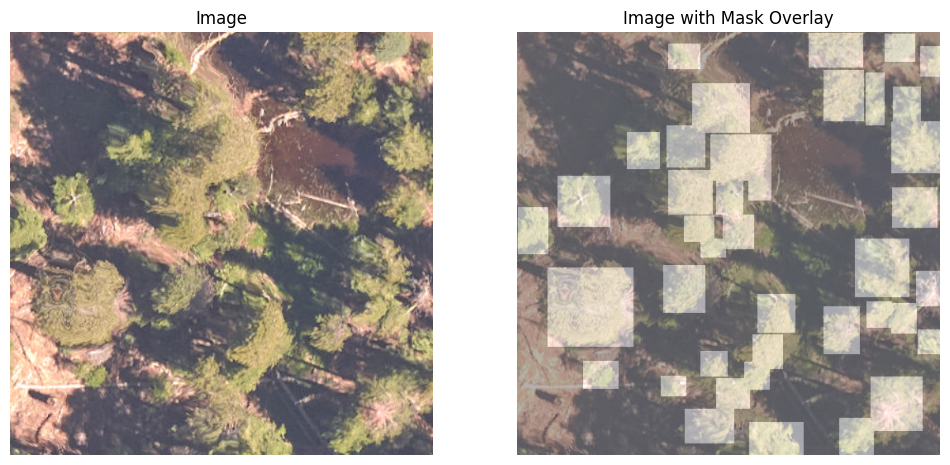

In [5]:
from torchvision import transforms
# Define any image transformations
image_size = (512, 512)
image_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
])
mask_transform = MaskToTensor(image_size=image_size)

# Example usage
image_dir = "/content/drive/MyDrive/weecology-NeonTreeEvaluation-f5d92da/evaluation/RGB"
xml_dir = "/content/drive/MyDrive/weecology-NeonTreeEvaluation-f5d92da/annotations"

# Split datasets and create loaders
train_dataset, val_dataset, test_dataset, unlabeled_dataset = create_datasets(
    image_dir=image_dir,
    xml_dir=xml_dir,
    transform=image_transforms,
    mask_transform=mask_transform,
    image_size=image_size
)

# Verify dataset sizes
print("Training set size:", len(train_dataset))
print("Validation set size:", len(val_dataset))
print("Test set size:", len(test_dataset))
print("Unlabeled set size:", len(unlabeled_dataset))
# Example of showing an image with annotations
idx = train_dataset.indices[0]
original_dataset = train_dataset.dataset
original_dataset.show_with_annotations(idx)  # Access the underlying dataset in the split

## Image Data Loader

In [6]:
from torch.utils.data import DataLoader

# Define the batch size for training, validation, and testing
batch_size = 2  # Adjust based on your memory capacity and model requirements

# Create DataLoader instances for each dataset
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
unlabeled_loader = DataLoader(unlabeled_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

## UNet Model

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()

        # Encoder path
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Decoder path (note the in_channels for each upconv block is doubled due to concatenation)
        self.dec4 = self.upconv_block(1024 + 512, 512)  # 1024 from bottleneck, 512 from encoder
        self.dec3 = self.upconv_block(512 + 256, 256)   # 512 from previous layer, 256 from encoder
        self.dec2 = self.upconv_block(256 + 128, 128)   # 256 from previous layer, 128 from encoder
        self.dec1 = self.upconv_block(128 + 64, 64)     # 128 from previous layer, 64 from encoder

        # Output layer
        self.out_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            self.conv_block(out_channels, out_channels)
        )

    def forward(self, x):
        # Encoder path
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, kernel_size=2))
        enc3 = self.enc3(F.max_pool2d(enc2, kernel_size=2))
        enc4 = self.enc4(F.max_pool2d(enc3, kernel_size=2))

        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, kernel_size=2))

        # Decoder path (align each upsampled layer with encoder's corresponding layer)
        dec4 = self.dec4(torch.cat([F.interpolate(bottleneck, size=enc4.shape[2:]), enc4], dim=1))
        dec3 = self.dec3(torch.cat([F.interpolate(dec4, size=enc3.shape[2:]), enc3], dim=1))
        dec2 = self.dec2(torch.cat([F.interpolate(dec3, size=enc2.shape[2:]), enc2], dim=1))
        dec1 = self.dec1(torch.cat([F.interpolate(dec2, size=enc1.shape[2:]), enc1], dim=1))

        # Output layer
        return torch.sigmoid(self.out_conv(dec1))  # Use sigmoid for binary segmentation

## Training

In [8]:
torch.cuda.empty_cache()
!nvidia-smi

Wed Nov 13 08:09:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [9]:
# Define the augmentation function
def augment(image):
    """
    Apply random augmentations to a single image.

    Args:
        image (torch.Tensor): Input image tensor of shape (C, H, W).

    Returns:
        torch.Tensor: Augmented image tensor of the same shape.
    """

    # Convert tensor to PIL image for augmentations that require it
    image = T.ToPILImage()(image)

    # Define a list of possible augmentations
    augmentations = T.Compose([
        T.RandomHorizontalFlip(p=0.5),
        T.RandomVerticalFlip(p=0.5),
        T.RandomRotation(degrees=20),
        T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        T.RandomResizedCrop(size=image.size, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
    ])

    # Apply augmentations
    image = augmentations(image)

    # Convert back to tensor
    image = T.ToTensor()(image)

    # Add Gaussian noise
    if random.random() < 0.5:
        noise = torch.randn_like(image) * 0.05  # Adjust noise level as needed
        image = image + noise
        image = torch.clamp(image, 0, 1)  # Ensure the values are still in valid range [0, 1]

    return image

In [11]:
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision.transforms as T

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(in_channels=3, out_channels=1).to(device)

# Hyperparameters
num_epochs = 20
learning_rate = 0.001
criterion = nn.BCELoss()  # Binary Cross Entropy Loss for segmentation
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Loss weights
lambda_supervised = 1.0
lambda_pseudo = 0.5
lambda_consistency = 0.1

# Initialize lists to store loss and accuracy
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

# Training and Validation Loop
for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    train_correct_pixels = 0
    train_total_pixels = 0

    for (labeled_images, labeled_masks), (unlabeled_images, _) in zip(train_loader, unlabeled_loader):
        labeled_images, labeled_masks = labeled_images.to(device), labeled_masks.to(device)
        unlabeled_images = unlabeled_images.to(device)

        # Forward pass for labeled data
        outputs = model(labeled_images)
        outputs = F.interpolate(outputs, size=(512, 512), mode='bilinear', align_corners=False)
        supervised_loss = F.binary_cross_entropy_with_logits(outputs, labeled_masks)

        # Calculate segmentation accuracy for labeled data
        preds = (outputs >= 0.5).float()  # Convert to binary predictions
        train_correct_pixels += (preds == labeled_masks).sum().item()  # Count correct pixels
        train_total_pixels += torch.numel(labeled_masks)  # Count total pixels

        # Pseudo-Labeling for Unlabeled Data
        with torch.no_grad():
            pseudo_labels = (model(unlabeled_images) >= 0.5).float()  # Binary pseudo-labels
        pseudo_outputs = model(unlabeled_images)
        pseudo_label_loss = F.binary_cross_entropy_with_logits(pseudo_outputs, pseudo_labels)

        # Consistency Regularization on Augmented Unlabeled Data
        # aug1, aug2 = augment(unlabeled_images), augment(unlabeled_images)  # Apply different augmentations
        pred1, pred2 = model(unlabeled_images), model(unlabeled_images)
        consistency_loss = F.mse_loss(pred1, pred2)

        #  Total loss
        loss = (lambda_supervised * supervised_loss +
                lambda_pseudo * pseudo_label_loss +
                lambda_consistency * consistency_loss)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    # Calculate average training loss and segmentation accuracy for the epoch
    train_loss /= len(train_loader)
    train_accuracy = train_correct_pixels / train_total_pixels if train_total_pixels > 0 else 0


    # Append to lists
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # # Validation Loop
    # model.eval()
    # val_loss = 0
    # val_correct_pixels = 0
    # val_total_pixels = 0
    # with torch.no_grad():
    #     for val_images, val_masks in val_loader:
    #         val_images, val_masks = val_images.to(device), val_masks.to(device)

    #         # Forward pass
    #         val_outputs = model(val_images)
    #         val_outputs = F.interpolate(val_outputs, size=(512, 512), mode='bilinear', align_corners=False)
    #         val_loss_batch = criterion(val_outputs, val_masks)
    #         val_loss += val_loss_batch.item()

    #         # Calculate validation segmentation accuracy
    #         val_preds = (val_outputs >= 0.5).float()
    #         val_correct_pixels += (val_preds == val_masks).sum().item()
    #         val_total_pixels += torch.numel(val_masks)

    # # Calculate average validation loss and accuracy
    # val_loss /= len(val_loader)
    # val_accuracy = val_correct_pixels / val_total_pixels if val_total_pixels > 0 else 0

    # val_losses.append(train_loss)
    # val_accuracies.append(train_accuracy)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

# Plotting the results
epochs = range(1, num_epochs + 1)

plt.figure(figsize=(12, 5))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Train Accuracy')
plt.plot(epochs, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Epoch [1/20], Train Loss: 1.0548, Train Accuracy: 0.6126
Epoch [2/20], Train Loss: 1.0397, Train Accuracy: 0.6202
Epoch [3/20], Train Loss: 1.0397, Train Accuracy: 0.6202
Epoch [4/20], Train Loss: 1.0397, Train Accuracy: 0.6202
Epoch [5/20], Train Loss: 1.0397, Train Accuracy: 0.6202


KeyboardInterrupt: 

In [12]:
import torch.optim as optim
import torch.nn.functional as F

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Testing Loop
model.eval()
test_loss = 0
correct_pixels = 0
total_pixels = 0

with torch.no_grad():
    for images, masks in test_loader:
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        outputs = F.interpolate(outputs, size=(512, 512), mode='bilinear', align_corners=False)
        loss = criterion(outputs, masks)
        test_loss += loss.item()

        # Calculate accuracy
        preds = outputs >= 0.5  # Threshold at 0.5 to get binary predictions
        correct_pixels += (preds == masks).sum().item()  # Count correct pixels
        total_pixels += torch.numel(masks)  # Total pixels in the mask

# Calculate average loss
test_loss /= len(test_loader)

# Calculate pixel accuracy
accuracy = correct_pixels / total_pixels

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 35.4186
Test Accuracy: 0.6458


### Predicted Image by UNet

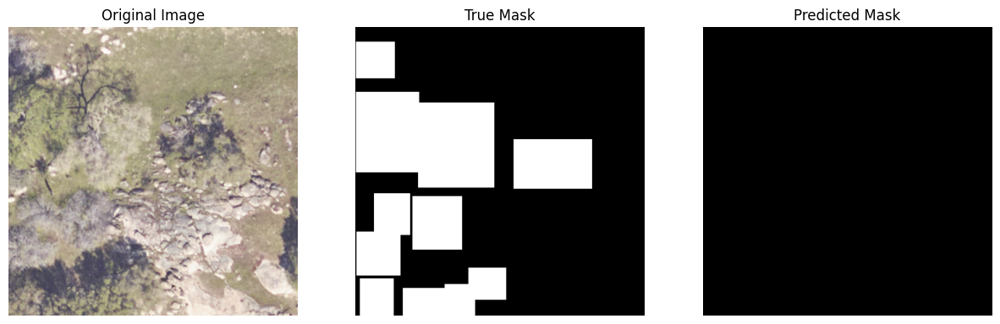

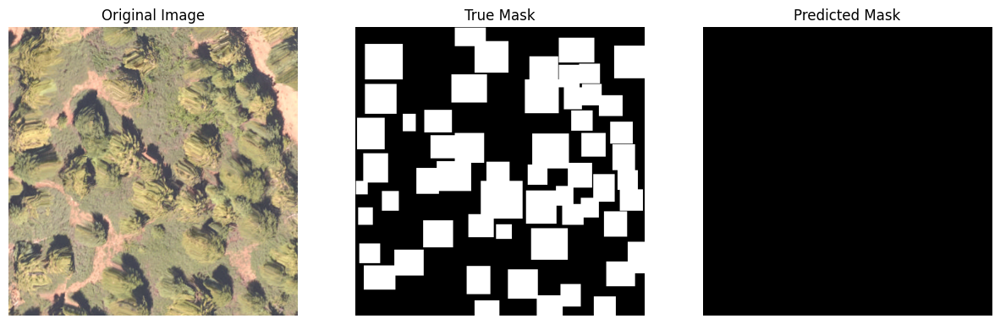

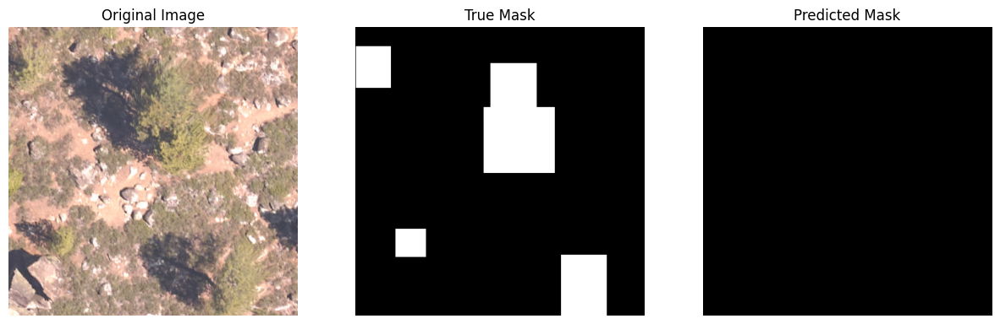

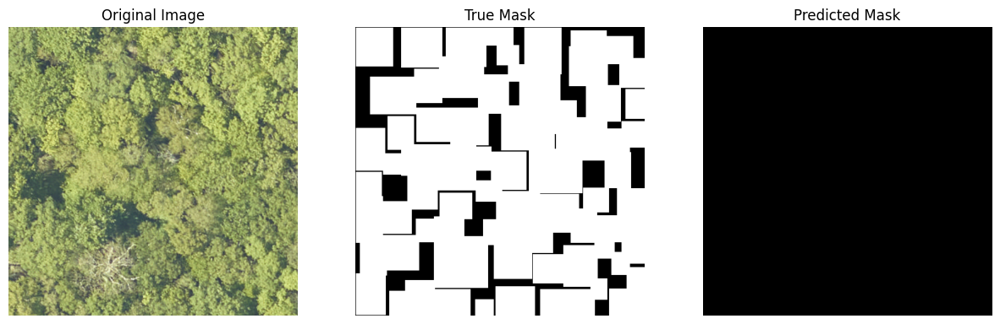

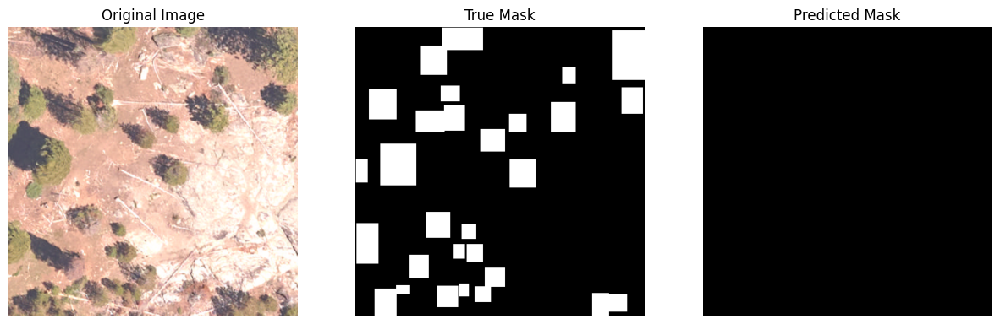

...

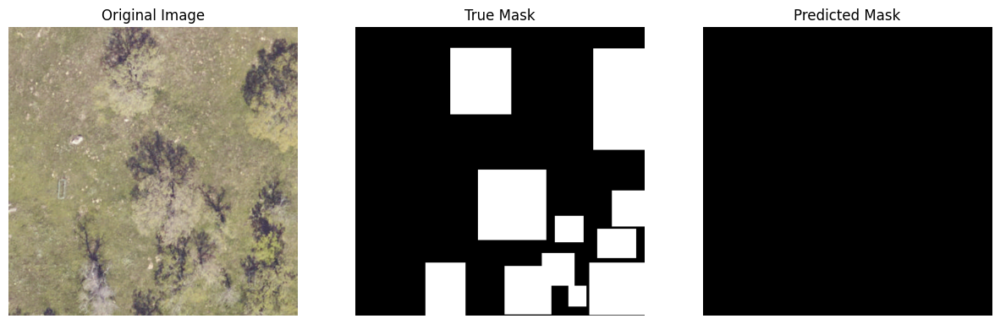

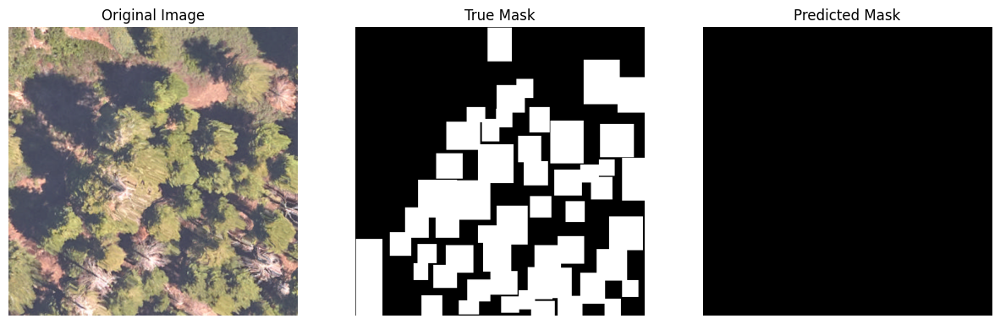

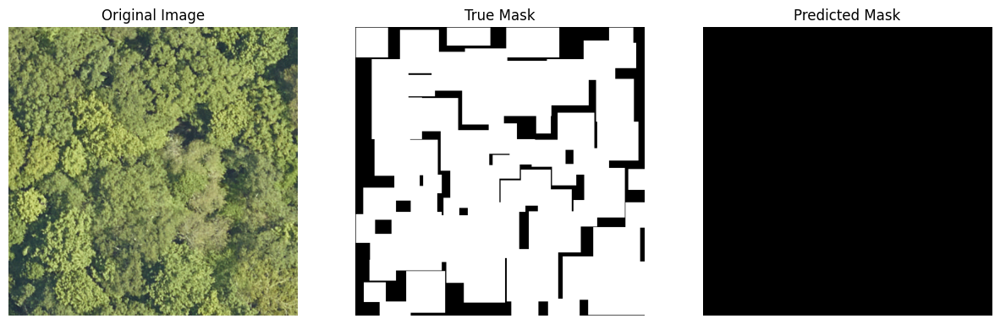

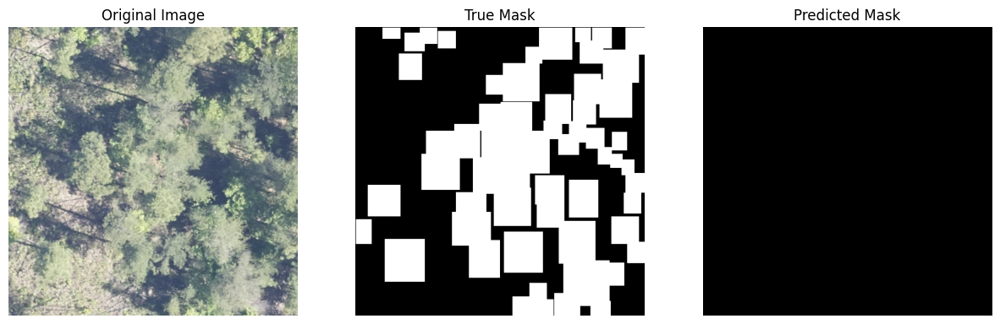

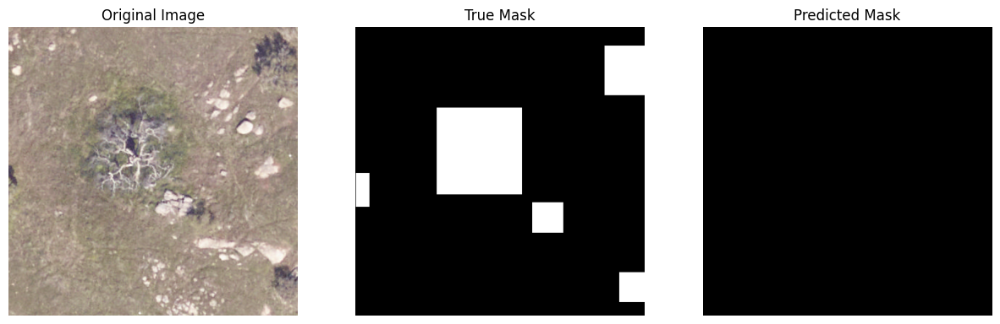

In [13]:
import matplotlib.pyplot as plt
import torch.nn.functional as F
import os

# Set the model to evaluation mode
model.eval()

# Define directory to save predicted masks (optional)
output_dir = "./predicted_masks"
os.makedirs(output_dir, exist_ok=True)

with torch.no_grad():
    for idx, (images, masks) in enumerate(test_loader):
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass to get predictions
        outputs = model(images)
        outputs = F.interpolate(outputs, size=(512, 512), mode='bilinear', align_corners=False)

        # Threshold outputs to get binary mask predictions
        preds = (outputs >= 0.5).float()  # Convert probabilities to binary masks

        # Loop through each image in the batch
        for i in range(images.size(0)):
            # Convert predicted mask and true mask to numpy arrays for visualization
            pred_mask = preds[i].cpu().squeeze().numpy()
            true_mask = masks[i].cpu().squeeze().numpy()
            original_image = images[i].cpu().permute(1, 2, 0).numpy()

            # Display or save predictions
            fig, ax = plt.subplots(1, 3, figsize=(15, 5))
            ax[0].imshow(original_image)
            ax[0].set_title("Original Image")
            ax[0].axis('off')

            ax[1].imshow(true_mask, cmap="gray")
            ax[1].set_title("True Mask")
            ax[1].axis('off')

            ax[2].imshow(pred_mask, cmap="gray")
            ax[2].set_title("Predicted Mask")
            ax[2].axis('off')

            plt.show()

            # Optionally save the predicted mask
            pred_mask_img = Image.fromarray((pred_mask * 255).astype(np.uint8))
            pred_mask_img.save(os.path.join(output_dir, f"pred_mask_{idx * images.size(0) + i}.png"))